In [8]:
from nltk.corpus import stopwords
import pandas as pd
import numpy as np
import os
import re
import nltk
#nltk.download('stopwords')
#nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import glob
import pandas as pds
N = 100
# Scikit Learn
from sklearn.feature_extraction.text import CountVectorizer
reff = np.zeros((N,1))
from keras import metrics
import math
sus =  np.zeros((N,1))
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report 
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt # this is used for the plot the graph

In [9]:
df = pd.DataFrame(columns=['raw_text', 'status'])


# Importar datos

In [10]:
folder_path = "TestData2/source/"

# Use glob to find all PDF files in the folder
files = glob.glob(os.path.join(folder_path, "*.txt"))
# Iterate over each PDF file
for file in files:
    # Do something with the PDF file
    # Open the PDF file
    txt = open(file, 'rb')

    # Create a PDF reader object
    content = txt.read()


    # Close the PDF file
    txt.close()
    
    df.loc[len(df)] = [content, "source"]
    
df

,raw_text,status
0,b'\xef\xbb\xbfMr. Dyce being par excellence th...,source
1,"b'\xef\xbb\xbfLAWRENCE J. BURPEE, Librarian Ot...",source
2,b'\xef\xbb\xbfThe man she loved would not be s...,source
3,"b'\xef\xbb\xbf457\n Spontaneous Combustion,...",source
4,b'\xef\xbb\xbfPREACHING AND PAGANISM\n\nBY\n\n...,source
...,...,...
95,b'\xef\xbb\xbfTHE GREATER LOVE\n\nby\n\nCHAPLA...,source
96,"b'\xef\xbb\xbfThus Dr. J. Clarke, in his treat...",source
97,"b'\xef\xbb\xbfNICKY-NAN, RESERVIST.\n\nBy Arth...",source
98,b'\xef\xbb\xbfADVENTURES AND LETTERS\n\nOF\n\n...,source


In [11]:
folder_path = "TestData2/suspeciuos/"

# Use glob to find all PDF files in the folder
files = glob.glob(os.path.join(folder_path, "*.txt"))
# Iterate over each PDF file
for file in files:
    # Do something with the PDF file
    # Open the PDF file
    txt = open(file, 'rb')

    # Create a PDF reader object
    content = txt.read()


    # Close the PDF file
    txt.close()
    
    df.loc[len(df)] = [content, "plagiarism"]
    
df

,raw_text,status
0,b'\xef\xbb\xbfMr. Dyce being par excellence th...,source
1,"b'\xef\xbb\xbfLAWRENCE J. BURPEE, Librarian Ot...",source
2,b'\xef\xbb\xbfThe man she loved would not be s...,source
3,"b'\xef\xbb\xbf457\n Spontaneous Combustion,...",source
4,b'\xef\xbb\xbfPREACHING AND PAGANISM\n\nBY\n\n...,source
...,...,...
195,b'\xef\xbb\xbfHISTORY OF KING CHARLES THE SECO...,plagiarism
196,b'\xef\xbb\xbfPREFACE\n\nWhen the publishers a...,plagiarism
197,"b'\xef\xbb\xbfKellaart\'s Golunda Newera is, I...",plagiarism
198,b'\xef\xbb\xbfIn the middle of the village we ...,plagiarism


In [21]:
# Stopwords
nltk.download("stopwords") 
from nltk.corpus import stopwords 

# Stemming --> get root of the word
from nltk.stem.porter import PorterStemmer 
from nltk.stem import SnowballStemmer # best stemmer


# Lemmatization --> get context
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem.wordnet import WordNetLemmatizer

#eliminarAcentos = lambda s: s.decode('utf-8').translate(str.maketrans("áàäéèëíìïòóöùúüÀÁÄÈÉËÌÍÏÒÓÖÙÚÜ", "aaaeeeiiiooouuuAAAEEEIIIOOOUUU")).encode('utf-8')


corpus = [] 
for i in list(df.loc[:,"raw_text"]):
    # 0. Quitamos acentos:
    #text = eliminarAcentos(i)
    # 1. Quitamos todo lo que no sea una letra:
    text = re.sub("[^a-zA-Z]", " ", i.decode("utf-8"))
    # 2. Todo en minúsculas:
    text = text.lower()
    # 2.1 Quitamos espacios multiples y dejamos solo uno:
    text = re.sub("[\s]+", " ", text)

    # 2.2 Extra: Quitar palabras de menos de 3 letras y espacios al principio y final
    text = re.sub(r"\W*\b\w{1,3}\b", "", text)
    text = text.strip()

    # 3. Separamos oraciones para obtener puras palabras
    text = text.split()

    # 4. Extraer el significado detrás de cada palabra Stemming o Lemmatization y eliminar ruido
    #stemmer = SnowballStemmer('spanish') # Best stemmer
    #ps = PorterStemmer()
    lemmatizer = WordNetLemmatizer()

    # 4.1 Además queremos quitar palabras irrelevantes como artículos
    all_stopwords = stopwords.words() 
    #all_stopwords.remove("palabra") # --> para excepciones que no queramos incluir

    # 4.2 Unimos el Stemmer/Lematization para cada palabra que no esté dentro de la lista de stopwords
    #text = [stemmer.stem(word) for word in text if word not in set(all_stopwords)]
    text = [lemmatizer.lemmatize(word) for word in text if word not in set(all_stopwords)]
    #text = [word for word in text if word not in set(all_stopwords)]

  
    # 5. Unir oraciones con espacios entre cada palabra
    text = " ".join(text)
    corpus.append(text)

corpus

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\matts\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


['dyce excellence judicious verbal critic scarcely egotistical claim priority emendation avoid thee friend note reading mentioned print appearance work evidence verbal conjecturers stumble suggestion corrector alteration passage found pope edition century circumstance exhibit great difficulty danger asserting conjecture absolutely unknown halliwell subject course capable indefinite extension hasty note probably occupy space spare consideration alcides shoe merit opinion elucidating single word great dramatist attempt mayhap failure laudable made make miss effort appears critic proposed read show truth completely retained alcides genitive robe understood explain austria skin coat coeur lion blanch cry lion robe disrobe lion robe lie observes bastard lie sightly back austria great alcides robe show burden back doth usual word play tempted read reading acting sura made alcides slight pause give hearer time supply robe robe lion skin allusion fable justify reading ancestor knew making geni

# Tardo 740 min en entranarse

In [23]:
filename = "corpus_processed.txt"  # Replace with the filename you want to use

with open(filename, "w") as file:
    for item in corpus:
        file.write(str(item) + "\n")

Necesitamos cambiar a categorical encoding

In [24]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["status"] = le.fit_transform(df["status"])

In [25]:
df

,raw_text,status
0,b'\xef\xbb\xbfMr. Dyce being par excellence th...,1
1,"b'\xef\xbb\xbfLAWRENCE J. BURPEE, Librarian Ot...",1
2,b'\xef\xbb\xbfThe man she loved would not be s...,1
3,"b'\xef\xbb\xbf457\n Spontaneous Combustion,...",1
4,b'\xef\xbb\xbfPREACHING AND PAGANISM\n\nBY\n\n...,1
...,...,...
195,b'\xef\xbb\xbfHISTORY OF KING CHARLES THE SECO...,0
196,b'\xef\xbb\xbfPREFACE\n\nWhen the publishers a...,0
197,"b'\xef\xbb\xbfKellaart\'s Golunda Newera is, I...",0
198,b'\xef\xbb\xbfIn the middle of the village we ...,0


Usaremos Tf-idf para vectorizar

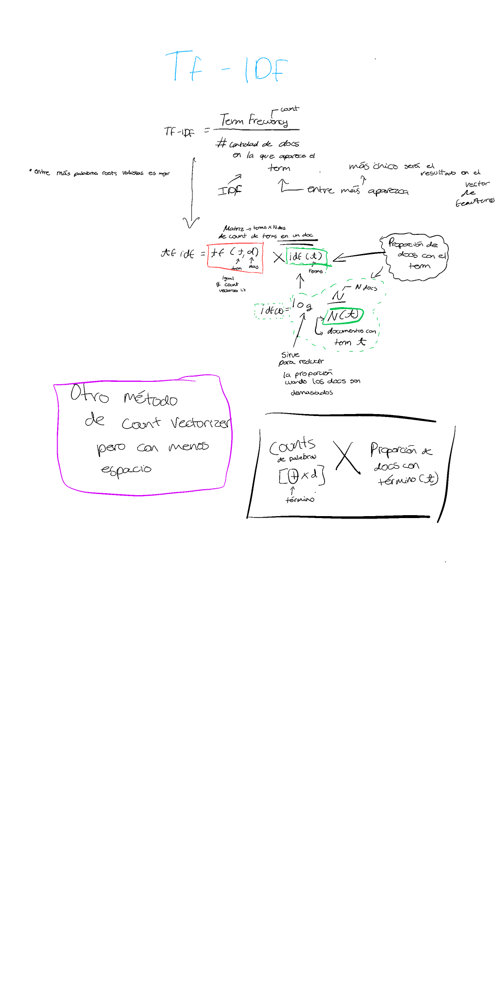

In [26]:

vectorizer = TfidfVectorizer()
import pickle
# Serialize the object and save it to a file
# with open('count_vectorizer.pkl', 'wb') as f:
#     pickle.dump(vectorizer, f)
X = vectorizer.fit_transform(corpus).toarray()
y = df["status"].values